<h2> Importing required libraries </h2>

In [6]:
import gdown
import tarfile
import os
import pickle
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
from PIL import Image
import tensorflow as tf
from keras.regularizers import l2
import cv2 as cv
from keras.models import load_model
from tensorflow.keras.applications import DenseNet121
from tqdm.notebook import tqdm
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.backend import expand_dims
from tensorflow import concat
tf.compat.v1.enable_eager_execution()
from tensorflow.keras.layers import TimeDistributed
import cv2
from google.colab.patches import cv2_imshow
from tensorflow.keras.layers import Input, Softmax, RNN, Dense, Embedding, LSTM,Layer,Dropout,GRU
from tensorflow.keras.models import Model
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow import repeat
from sklearn.utils import shuffle
import nltk.translate.bleu_score as bleu
import warnings
warnings.filterwarnings('ignore')



In [7]:
url = 'https://drive.google.com/uc?id=1U7D9lnjH-0CaXzhmua2rMtmdgS4DEH2k'
output = 'proccessed.pkl'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1U7D9lnjH-0CaXzhmua2rMtmdgS4DEH2k
To: /content/proccessed.pkl
100%|██████████| 58.1M/58.1M [00:01<00:00, 35.5MB/s]


'proccessed.pkl'

In [8]:
url = 'https://drive.google.com/uc?id=1--clwDc2F3_CF6O4EB_BnDewFjHmFL_7'
output = 'NLMCXR_png.tgz'
gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1--clwDc2F3_CF6O4EB_BnDewFjHmFL_7
From (redirected): https://drive.google.com/uc?id=1--clwDc2F3_CF6O4EB_BnDewFjHmFL_7&confirm=t&uuid=ac0a75d7-dbd4-4f7a-bb80-523309db964f
To: /content/NLMCXR_png.tgz
100%|██████████| 1.36G/1.36G [00:16<00:00, 80.5MB/s]


'NLMCXR_png.tgz'

In [9]:
cwd = os.getcwd()
tf1 = tarfile.open('NLMCXR_png.tgz')
tf1.extractall(cwd+'/png/')

In [10]:
data = pd.read_pickle('/content/proccessed.pkl')

<h2> Test train split </h2>

In [11]:
X_train, X_test = train_test_split(data.values , test_size = 0.2 )

In [12]:
X_train.shape

(2669, 8)

In [13]:
X_train = X_train[:-19, :]
X_test = X_test[:-18, :]

In [14]:
X_train.shape

(2650, 8)

In [15]:
X_test.shape

(650, 8)

In [16]:
data.columns

Index(['patient_id', 'image1', 'image2', 'findings', 'image_features',
       'findings_total', 'dec_ip', 'dec_op'],
      dtype='object')

In [17]:

t1 = Tokenizer( filters='!"#$%&()*+,-/:;=?@[\\]^_`{|}~\t\n',oov_token='OOV')
t1.fit_on_texts(X_train[:,5])
vocab_size_imp = len(t1.word_index) + 1

dec_inp = t1.texts_to_sequences(X_train[:,6])

dec_inp = pad_sequences(dec_inp, maxlen=76, padding='post')

dec_inp_cv = t1.texts_to_sequences(X_test[:,6])

dec_inp_cv = pad_sequences(dec_inp_cv, maxlen=76, padding='post')

dec_op = t1.texts_to_sequences(X_train[:,7])

dec_op = pad_sequences(dec_op, maxlen=76, padding='post')

dec_op_cv = t1.texts_to_sequences(X_test[:,7])

dec_op_cv = pad_sequences(dec_op_cv, maxlen=76, padding='post')

In [18]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [19]:

with open('t1.pickle', 'wb') as handle:
    pickle.dump(t1, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [20]:
!cp -r /content/t1.pickle /content/drive/MyDrive

In [21]:
vocab_size_imp

1863

In [22]:
imp1 = {}
imp2 = {}
for key,value in t1.word_index.items():
  imp1[value] = key
  imp2[key] = value

<h2> Encoder </h2>

In [23]:
class Encoder(tf.keras.Model):
    '''
    Encoder model -- That takes a input sequence and returns output sequence
    '''

    def __init__(self,units):
        super().__init__()
        self.units = units
        self.dense = Dense(self.units,name = 'Enc_dense')


    def call(self,img):
      '''
          This function takes a sequence input and the initial states of the encoder.
          Pass the input_sequence input to the Embedding layer, Pass the embedding layer ouput to encoder_lstm
          returns -- All encoder_outputs, last time steps hidden and cell state
      '''
      #enc_out = self.maxpool(tf.expand_dims(img,axis = 2))
      enc_out = self.dense(img)
      return enc_out


    def initialize_states(self,batch_size):
      '''
      Given a batch size it will return intial hidden state and intial cell state.
      If batch size is 32- Hidden state is zeros of size [32,lstm_units], cell state zeros is of size [32,lstm_units]
      '''
      self.batch_size  = batch_size

      self.enc_h =tf.zeros((self.batch_size, self.units))

      #self.enc_c = tf.zeros((self.batch_size, self.lstm_size))
      return self.enc_h


<h2> Attention </h2>

In [24]:
class Attention(tf.keras.layers.Layer):
  '''
    Class the calculates score based on the scoring_function using Bahdanu attention mechanism.
  '''
  def __init__(self,att_units):
    # Please go through the reference notebook and research paper to complete the scoring functions
    super().__init__()

    self.att_units = att_units

    self.w1 =  tf.keras.layers.Dense( self.att_units , name = 'w1')
    self.w2 =  tf.keras.layers.Dense( self.att_units,name = 'w2')
    self.v =  tf.keras.layers.Dense(1,name = 'v')

  def call(self,decoder_hidden_state,encoder_output):
    '''
      Attention mechanism takes two inputs current step -- decoder_hidden_state and all the encoder_outputs.
      * Based on the scoring function we will find the score or similarity between decoder_hidden_state and encoder_output.
        Multiply the score function with your encoder_outputs to get the context vector.
        Function returns context vector and attention weights(softmax - scores)
    '''
    self.decoder_hidden_state = decoder_hidden_state
    self.encoder_output = encoder_output


    self.decoder_hidden_state = tf.expand_dims(self.decoder_hidden_state,axis = 1)
    score = self.v(tf.nn.tanh(
              self.w1(self.decoder_hidden_state) + self.w2(self.encoder_output)))
    attention_weights = tf.nn.softmax(score, axis=1)
    context_vector = attention_weights * self.encoder_output
    context_vector = tf.reduce_sum(context_vector, axis=1)
    return context_vector,attention_weights




<h2> Onestepdecoder </h2>

In [25]:
class OneStepDecoder(tf.keras.Model):
  def __init__(self,tar_vocab_size, embedding_dim, input_length, dec_units  ,att_units):

      # Initialize decoder embedding layer, LSTM and any other objects needed
      super().__init__()
      self.tar_vocab_size = tar_vocab_size
      self.embedding_dim = embedding_dim
      self.input_length = input_length
      self.dec_units = dec_units
      self.att_units = att_units
      self.dec_emb = Embedding(tar_vocab_size,embedding_dim,trainable = True , name = 'dec_embb')
      self.dec_lstm = GRU(self.dec_units, return_state=True, return_sequences=True, name="Decoder_LSTM")
      self.dense   = Dense(self.tar_vocab_size, name = 'one_dec')
      self.attention=Attention( self.att_units)
      self.d1 = Dropout(0.3,name = 'd1')
      self.d2 = Dropout(0.3,name = 'd2')
      self.d3 = Dropout(0.3,name = 'd3')

  @tf.function
  def call(self,input_to_decoder, encoder_output, state_h):
    '''
        One step decoder mechanisim step by step:
      A. Pass the input_to_decoder to the embedding layer and then get the output(batch_size,1,embedding_dim)
      B. Using the encoder_output and decoder hidden state, compute the context vector.
      C. Concat the context vector with the step A output
      D. Pass the Step-C output to LSTM/GRU and get the decoder output and states(hidden and cell state)
      E. Pass the decoder output to dense layer(vocab size) and store the result into output.
      F. Return the states from step D, output from Step E, attention weights from Step -B
    '''
    self.input_to_decoder = input_to_decoder
    self.encoder_output = encoder_output
    self.state_h = state_h

    #A
    target_embedd           = self.dec_emb (self.input_to_decoder)     #(batch_size,1,embedingdim)
    #B
    target_embedd = self.d1(target_embedd)

    context_vector,attention_weights=self.attention(self.state_h,self.encoder_output) #context vector shape = (batch_size,att_units)
    #C
    concated = tf.concat([  tf.expand_dims(context_vector, 1),target_embedd], -1)
    concated = self.d2(concated)

    #D
    lstm_output, hs      = self.dec_lstm(concated, initial_state=self.state_h)

    lstm_output = tf.reshape(lstm_output, (-1, lstm_output.shape[2]))
    lstm_output = self.d3(lstm_output)
    #E
    op = self.dense(lstm_output)
    #op = tf.squeeze(op,[1])
    return op,hs,attention_weights,context_vector



<h2> Decoder </h2>

In [26]:
class Decoder(tf.keras.Model):
    def __init__(self,out_vocab_size, embedding_dim, input_length, dec_units ,att_units):
      #Intialize necessary variables and create an object from the class onestepdecoder
      super().__init__()
      self.out_vocab_size = out_vocab_size
      self.embedding_dim = embedding_dim
      self.input_length = input_length
      self.dec_units = dec_units
      self.att_units = att_units
      self.onestep = OneStepDecoder(self.out_vocab_size,self.embedding_dim ,self.input_length,self.dec_units,self.att_units)

    @tf.function
    def call(self, input_to_decoder,encoder_output,decoder_hidden_state):


        #Initialize an empty Tensor array, that will store the outputs at each and every time step
        #Create a tensor array as shown in the reference notebook

        #Iterate till the length of the decoder input
            # Call onestepdecoder for each token in decoder_input
            # Store the output in tensorarray
        # Return the tensor array

        all_outputs = tf.TensorArray(tf.float32,size =input_to_decoder.shape[1],name = 'output_arrays' )
        self.input_to_decoder = input_to_decoder
        self.encoder_output = encoder_output
        self.decoder_hidden_state = decoder_hidden_state

        for timestep in tf.range(input_to_decoder.shape[1]):
          op,hs,attention_weights,context_vector = self.onestep(self.input_to_decoder[:,timestep:timestep+1], self.encoder_output, self.decoder_hidden_state)
          self.decoder_hidden_state = hs
          all_outputs = all_outputs.write(timestep,op)
        all_outputs = tf.transpose(all_outputs.stack(),[1,0,2])
        return all_outputs

<h2> Encoder - Decoder </h2>

In [27]:
class encoder_decoder(tf.keras.Model):
  #def __init__(self,#params):
    #Intialize objects from encoder decoder
  def __init__(self,out_vocab_size , embedding_size_d, input_length_d,lstm_size_d,att_units,batch_size,units):

        #Create encoder object
        #Create decoder object
        #Intialize Dense layer(out_vocab_size) with activation='softmax'
        super().__init__()

        self.units = units
        self.out_vocab_size = out_vocab_size
        self.embedding_size_d = embedding_size_d
        self.lstm_size_d = lstm_size_d
        self.input_length_d = input_length_d
        self.batch_size = batch_size
        self.att_units = att_units

        self.encoder = Encoder(self.units)

        self.decoder = Decoder(out_vocab_size , embedding_size_d, input_length_d,lstm_size_d,att_units )
        #self.dense   = TimeDistributed(Dense(self.out_vocab_size, activation='softmax'))
        self.dense   = Dense(self.out_vocab_size,name = 'enc_dec_dense')



  def call(self,data):
    #Intialize encoder states, Pass the encoder_sequence to the embedding layer
    # Decoder initial states are encoder final states, Initialize it accordingly
    # Pass the decoder sequence,encoder_output,decoder states to Decoder
    # return the decoder output
    self.inputs,self.outputs = data[0], data[1]
    print("="*20, "ENCODER", "="*20)
    self.encoder_h= self.encoder.initialize_states(self.batch_size)
    self.encoder_output = self.encoder(self.inputs)
    print("-"*27)
    print("ENCODER ==> OUTPUT SHAPE",self.encoder_output.shape)
    print("ENCODER ==> HIDDEN STATE SHAPE",self.encoder_h.shape)
    print("="*20, "DECODER", "="*20)
    output= self.decoder(self.outputs,self.encoder_output,self.encoder_h)
    print("-"*27)
    print("FINAL OUTPUT SHAPE",output.shape)
    print("="*50)
    return output





<h2> Loss function </h2>

In [28]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)
  #out_vocab_size , embedding_size_d, input_length_d,lstm_size_d,att_units,batch_size)

<h2> Call Backs <h2>

In [29]:
!mkdir checkpoint

mkdir: cannot create directory ‘checkpoint’: File exists


In [30]:
checkpoint_filepath = cwd + '/' + 'checkpoint' + '/'

In [31]:
checkpoint_filepath

'/content/checkpoint/'

<h3> Check point <h3>

In [32]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_loss',
    verbose = 1,
    mode='min',
    save_best_only=True)

In [33]:
tf.keras.backend.clear_session()

<h3> LR optimizer <h3>

In [34]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.8,mode = 'min',verbose = 1,
                              patience=2, min_lr=0.0001)

<h2> Compiling model </h2>

In [35]:
model_1 = encoder_decoder(vocab_size_imp,300,76,256,64,50,256)
optimizer = tf.keras.optimizers.Adam()
model_1.compile(optimizer=optimizer,loss=loss_function, metrics = "accuracy")

In [36]:
train_inp = np.vstack(X_train[:,4]).astype(np.float64)  # Use np.float64 for double-precision floats
test_inp = np.vstack(X_test[:,4]).astype(np.float32)  # Use np.float32 for single-precision floats (if memory efficiency is a concern)


<h2> fitting model </h2>

In [37]:
model_1.fit([train_inp,dec_inp ],dec_op ,validation_data= ([test_inp, dec_inp_cv],dec_op_cv),batch_size= 50,epochs  = 40,callbacks=[reduce_lr,model_checkpoint_callback] , shuffle=True)

Epoch 1/40
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (50, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (50, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)
53/53 [==============================] - ETA: 0s - loss: 2.2849 - accuracy: 0.0220==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (50, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)

Epoch 1: val_loss improved from inf to 2.05539, saving model to /content/checkpoint/
==================== EN

==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 38s 540ms/step - loss: 2.2849 - accuracy: 0.0220 - val_loss: 2.0554 - val_accuracy: 0.0223 - lr: 0.0010
Epoch 2/40
53/53 [==============================] - ETA: 0s - loss: 2.1550 - accuracy: 0.0228
Epoch 2: val_loss improved from 2.05539 to 2.03070, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 526ms/step - loss: 2.1550 - accuracy: 0.0228 - val_loss: 2.0307 - val_accuracy: 0.0238 - lr: 0.0010
Epoch 3/40
53/53 [==============================] - ETA: 0s - loss: 2.1239 - accuracy: 0.0254
Epoch 3: val_loss improved from 2.03070 to 1.99093, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 27s 522ms/step - loss: 2.1239 - accuracy: 0.0254 - val_loss: 1.9909 - val_accuracy: 0.0291 - lr: 0.0010
Epoch 4/40
53/53 [==============================] - ETA: 0s - loss: 2.0791 - accuracy: 0.0328
Epoch 4: val_loss improved from 1.99093 to 1.94576, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 26s 486ms/step - loss: 2.0791 - accuracy: 0.0328 - val_loss: 1.9458 - val_accuracy: 0.0381 - lr: 0.0010
Epoch 5/40
53/53 [==============================] - ETA: 0s - loss: 2.0204 - accuracy: 0.0450
Epoch 5: val_loss improved from 1.94576 to 1.86205, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 32s 608ms/step - loss: 2.0204 - accuracy: 0.0450 - val_loss: 1.8621 - val_accuracy: 0.0567 - lr: 0.0010
Epoch 6/40
53/53 [==============================] - ETA: 0s - loss: 1.8547 - accuracy: 0.0735
Epoch 6: val_loss improved from 1.86205 to 1.57030, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 530ms/step - loss: 1.8547 - accuracy: 0.0735 - val_loss: 1.5703 - val_accuracy: 0.1050 - lr: 0.0010
Epoch 7/40
53/53 [==============================] - ETA: 0s - loss: 1.4935 - accuracy: 0.1327
Epoch 7: val_loss improved from 1.57030 to 1.23652, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 25s 473ms/step - loss: 1.4935 - accuracy: 0.1327 - val_loss: 1.2365 - val_accuracy: 0.1601 - lr: 0.0010
Epoch 8/40
53/53 [==============================] - ETA: 0s - loss: 1.2411 - accuracy: 0.1705
Epoch 8: val_loss improved from 1.23652 to 1.08383, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 536ms/step - loss: 1.2411 - accuracy: 0.1705 - val_loss: 1.0838 - val_accuracy: 0.1811 - lr: 0.0010
Epoch 9/40
53/53 [==============================] - ETA: 0s - loss: 1.1106 - accuracy: 0.1885
Epoch 9: val_loss improved from 1.08383 to 1.00042, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 527ms/step - loss: 1.1106 - accuracy: 0.1885 - val_loss: 1.0004 - val_accuracy: 0.1935 - lr: 0.0010
Epoch 10/40
53/53 [==============================] - ETA: 0s - loss: 1.0274 - accuracy: 0.2001
Epoch 10: val_loss improved from 1.00042 to 0.94145, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 25s 473ms/step - loss: 1.0274 - accuracy: 0.2001 - val_loss: 0.9414 - val_accuracy: 0.2058 - lr: 0.0010
Epoch 11/40
53/53 [==============================] - ETA: 0s - loss: 0.9697 - accuracy: 0.2089
Epoch 11: val_loss improved from 0.94145 to 0.90437, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 528ms/step - loss: 0.9697 - accuracy: 0.2089 - val_loss: 0.9044 - val_accuracy: 0.2118 - lr: 0.0010
Epoch 12/40
53/53 [==============================] - ETA: 0s - loss: 0.9240 - accuracy: 0.2167
Epoch 12: val_loss improved from 0.90437 to 0.87469, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 26s 487ms/step - loss: 0.9240 - accuracy: 0.2167 - val_loss: 0.8747 - val_accuracy: 0.2168 - lr: 0.0010
Epoch 13/40
53/53 [==============================] - ETA: 0s - loss: 0.8862 - accuracy: 0.2224
Epoch 13: val_loss improved from 0.87469 to 0.85327, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 29s 547ms/step - loss: 0.8862 - accuracy: 0.2224 - val_loss: 0.8533 - val_accuracy: 0.2214 - lr: 0.0010
Epoch 14/40
53/53 [==============================] - ETA: 0s - loss: 0.8545 - accuracy: 0.2274
Epoch 14: val_loss improved from 0.85327 to 0.83656, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 30s 567ms/step - loss: 0.8545 - accuracy: 0.2274 - val_loss: 0.8366 - val_accuracy: 0.2253 - lr: 0.0010
Epoch 15/40
53/53 [==============================] - ETA: 0s - loss: 0.8259 - accuracy: 0.2312
Epoch 15: val_loss improved from 0.83656 to 0.81941, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 27s 502ms/step - loss: 0.8259 - accuracy: 0.2312 - val_loss: 0.8194 - val_accuracy: 0.2286 - lr: 0.0010
Epoch 16/40
53/53 [==============================] - ETA: 0s - loss: 0.8020 - accuracy: 0.2355
Epoch 16: val_loss improved from 0.81941 to 0.81295, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 525ms/step - loss: 0.8020 - accuracy: 0.2355 - val_loss: 0.8130 - val_accuracy: 0.2298 - lr: 0.0010
Epoch 17/40
53/53 [==============================] - ETA: 0s - loss: 0.7816 - accuracy: 0.2390
Epoch 17: val_loss improved from 0.81295 to 0.80185, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 26s 488ms/step - loss: 0.7816 - accuracy: 0.2390 - val_loss: 0.8018 - val_accuracy: 0.2336 - lr: 0.0010
Epoch 18/40
53/53 [==============================] - ETA: 0s - loss: 0.7607 - accuracy: 0.2429
Epoch 18: val_loss improved from 0.80185 to 0.79310, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 27s 512ms/step - loss: 0.7607 - accuracy: 0.2429 - val_loss: 0.7931 - val_accuracy: 0.2351 - lr: 0.0010
Epoch 19/40
53/53 [==============================] - ETA: 0s - loss: 0.7435 - accuracy: 0.2453
Epoch 19: val_loss improved from 0.79310 to 0.78699, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 539ms/step - loss: 0.7435 - accuracy: 0.2453 - val_loss: 0.7870 - val_accuracy: 0.2371 - lr: 0.0010
Epoch 20/40
53/53 [==============================] - ETA: 0s - loss: 0.7274 - accuracy: 0.2479
Epoch 20: val_loss improved from 0.78699 to 0.77952, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 25s 480ms/step - loss: 0.7274 - accuracy: 0.2479 - val_loss: 0.7795 - val_accuracy: 0.2401 - lr: 0.0010
Epoch 21/40
53/53 [==============================] - ETA: 0s - loss: 0.7102 - accuracy: 0.2509
Epoch 21: val_loss improved from 0.77952 to 0.77316, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 29s 546ms/step - loss: 0.7102 - accuracy: 0.2509 - val_loss: 0.7732 - val_accuracy: 0.2402 - lr: 0.0010
Epoch 22/40
53/53 [==============================] - ETA: 0s - loss: 0.6978 - accuracy: 0.2532
Epoch 22: val_loss improved from 0.77316 to 0.76893, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 529ms/step - loss: 0.6978 - accuracy: 0.2532 - val_loss: 0.7689 - val_accuracy: 0.2421 - lr: 0.0010
Epoch 23/40
53/53 [==============================] - ETA: 0s - loss: 0.6814 - accuracy: 0.2564
Epoch 23: val_loss improved from 0.76893 to 0.76401, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 32s 600ms/step - loss: 0.6814 - accuracy: 0.2564 - val_loss: 0.7640 - val_accuracy: 0.2425 - lr: 0.0010
Epoch 24/40
53/53 [==============================] - ETA: 0s - loss: 0.6732 - accuracy: 0.2585
Epoch 24: val_loss improved from 0.76401 to 0.76066, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 518ms/step - loss: 0.6732 - accuracy: 0.2585 - val_loss: 0.7607 - val_accuracy: 0.2445 - lr: 0.0010
Epoch 25/40
53/53 [==============================] - ETA: 0s - loss: 0.6597 - accuracy: 0.2610
Epoch 25: val_loss improved from 0.76066 to 0.75939, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 530ms/step - loss: 0.6597 - accuracy: 0.2610 - val_loss: 0.7594 - val_accuracy: 0.2440 - lr: 0.0010
Epoch 26/40
53/53 [==============================] - ETA: 0s - loss: 0.6494 - accuracy: 0.2619
Epoch 26: val_loss improved from 0.75939 to 0.75657, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 25s 478ms/step - loss: 0.6494 - accuracy: 0.2619 - val_loss: 0.7566 - val_accuracy: 0.2451 - lr: 0.0010
Epoch 27/40
53/53 [==============================] - ETA: 0s - loss: 0.6396 - accuracy: 0.2648
Epoch 27: val_loss improved from 0.75657 to 0.75576, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 29s 549ms/step - loss: 0.6396 - accuracy: 0.2648 - val_loss: 0.7558 - val_accuracy: 0.2465 - lr: 0.0010
Epoch 28/40
53/53 [==============================] - ETA: 0s - loss: 0.6302 - accuracy: 0.2655
Epoch 28: val_loss improved from 0.75576 to 0.75219, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 27s 513ms/step - loss: 0.6302 - accuracy: 0.2655 - val_loss: 0.7522 - val_accuracy: 0.2466 - lr: 0.0010
Epoch 29/40
53/53 [==============================] - ETA: 0s - loss: 0.6199 - accuracy: 0.2681
Epoch 29: val_loss did not improve from 0.75219
53/53 [==============================] - 21s 387ms/step - loss: 0.6199 - accuracy: 0.2681 - val_loss: 0.7539 - val_accuracy: 0.2466 - lr: 0.0010
Epoch 30/40
53/53 [==============================] - ETA: 0s - loss: 0.6125 - accuracy: 0.2699
Epoch 30: val_loss improved from 0.75219 to 0.74994, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 25s 483ms/step - loss: 0.6125 - accuracy: 0.2699 - val_loss: 0.7499 - val_accuracy: 0.2476 - lr: 0.0010
Epoch 31/40
53/53 [==============================] - ETA: 0s - loss: 0.6043 - accuracy: 0.2707
Epoch 31: val_loss did not improve from 0.74994
53/53 [==============================] - 23s 435ms/step - loss: 0.6043 - accuracy: 0.2707 - val_loss: 0.7525 - val_accuracy: 0.2478 - lr: 0.0010
Epoch 32/40
53/53 [==============================] - ETA: 0s - loss: 0.5973 - accuracy: 0.2719
Epoch 32: val_loss improved from 0.74994 to 0.74784, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 31s 593ms/step - loss: 0.5973 - accuracy: 0.2719 - val_loss: 0.7478 - val_accuracy: 0.2502 - lr: 0.0010
Epoch 33/40
53/53 [==============================] - ETA: 0s - loss: 0.5904 - accuracy: 0.2733
Epoch 33: val_loss did not improve from 0.74784
53/53 [==============================] - 20s 384ms/step - loss: 0.5904 - accuracy: 0.2733 - val_loss: 0.7497 - val_accuracy: 0.2477 - lr: 0.0010
Epoch 34/40
53/53 [==============================] - ETA: 0s - loss: 0.5827 - accuracy: 0.2751
Epoch 34: val_loss improved from 0.74784 to 0.74583, saving model to /content/checkpoint/
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (50, 76, 1863)


==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 26s 489ms/step - loss: 0.5827 - accuracy: 0.2751 - val_loss: 0.7458 - val_accuracy: 0.2498 - lr: 0.0010
Epoch 35/40
53/53 [==============================] - ETA: 0s - loss: 0.5770 - accuracy: 0.2761
Epoch 35: val_loss did not improve from 0.74583
53/53 [==============================] - 23s 426ms/step - loss: 0.5770 - accuracy: 0.2761 - val_loss: 0.7477 - val_accuracy: 0.2501 - lr: 0.0010
Epoch 36/40
53/53 [==============================] - ETA: 0s - loss: 0.5702 - accuracy: 0.2773
Epoch 36: ReduceLROnPlateau reducing learning rate to 0.000800000037997961.

Epoch 36: val_loss did not improve from 0.74583
53/53 [==============================] - 21s 389ms/step - loss: 0.5702 - accuracy: 0.2773 - val_loss: 0.7514 - val_accuracy: 0.2501 - lr: 0.0010
Epoch 37/40
53/53 [==============================] - ETA: 0s - loss: 0.5607 - accuracy: 0.2789
Epoch 37: val_loss did not improve from 0.74583
53/53 [==============================] - 21s 401ms/step - l

==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)
==================== ENCODER ====================
---------------------------
ENCODER ==> OUTPUT SHAPE (None, 256)
ENCODER ==> HIDDEN STATE SHAPE (50, 256)
==================== DECODER ====================
---------------------------
FINAL OUTPUT SHAPE (None, 76, 1863)


53/53 [==============================] - 28s 528ms/step - loss: 0.5401 - accuracy: 0.2836 - val_loss: 0.7457 - val_accuracy: 0.2520 - lr: 6.4000e-04


<h2> Inferring Using Beam Search </h2>

In [38]:
model_1.load_weights(checkpoint_filepath)

In [39]:
#https://machinelearningmastery.com/beam-search-decoder-natural-language-processing/
#https://github.com/vysakh10/Medical-Report-Generation-using-Deep-Learning/blob/master/Attention_Onestep_Mod.ipynb
def beam(sentence):
  """ Thi function predicts the sentence using beam search """

  initial_state=model_1.layers[0].initialize_states(1)
  encoder_output= model_1.layers[0](sentence)
  result = ''

  sequences = [['<start>' ,initial_state, 0]]

  decoder_hidden_state = initial_state

  #cur_vec = np.ones((1, 1)) * imp2['<start>']
  #cur_vec = np.array([[1]])
  finished_seq = []
  beam_width = 3

  for i in range(76):
    all_candidates = []
    new_seq = []
    for s in sequences:

      cur_vec = np.reshape(imp2[s[0].split(" ")[-1]],(1,1))
      decoder_hidden_state = s[1]
      op,hs,attention_weights,context_vector = model_1.layers[1].onestep(cur_vec, encoder_output, decoder_hidden_state)
      op = tf.nn.softmax(op)
      top3 = np.argsort(op).flatten()[-beam_width:]
      for t in top3:

         candidates = [s[0] + ' '+ imp1[t], hs,s[2]-np.log(np.array(op).flatten()[t])]
         all_candidates.append(candidates)
    sequences = sorted(all_candidates, key = lambda l: l[2])[:beam_width]

    count = 0
    for s1 in sequences:
      if s1[0].split(" ")[-1] == '<end>':


        s1[2] = s1[2]/len(s1[0])   # normalized
        finished_seq.append([s1[0], s1[1],s1[2]])
        count+=1
      else:

        new_seq.append([s1[0], s1[1],s1[2]])

    beam_width -= count
    sequences = new_seq
    if not sequences:
      break
    else:
      continue

  if len(finished_seq) >0:
    sequences = finished_seq[-1]
    return sequences[0]
  else:
    return new_seq[-1][0]



In [40]:
data.columns

Index(['patient_id', 'image1', 'image2', 'findings', 'image_features',
       'findings_total', 'dec_ip', 'dec_op'],
      dtype='object')

<h2> Image data for inference </h2>

Original Sentence is :  <start> heart size and mediastinal contour are normal. pulmonary vascularity is normal. lungs are mildly hyperepanded but clear. no pleural effusions or pneumothoraces. degenerative changes in the thoracic spine.
Predicted Sentence is :  <start> the heart is normal in size. the lungs are clear. there is no pleural effusion or pneumothora is seen. there is no pleural effusion or pneumothora is identified. there is no pleural effusion or pneumothora is identified. there is no pleural effusion or pneumothora is identified. there is no pleural effusion or pneumothora is identified. there is no pleural effusion or pneumothora is identified. there is no pleural effusion. there is no pleural effusion or pneumothora


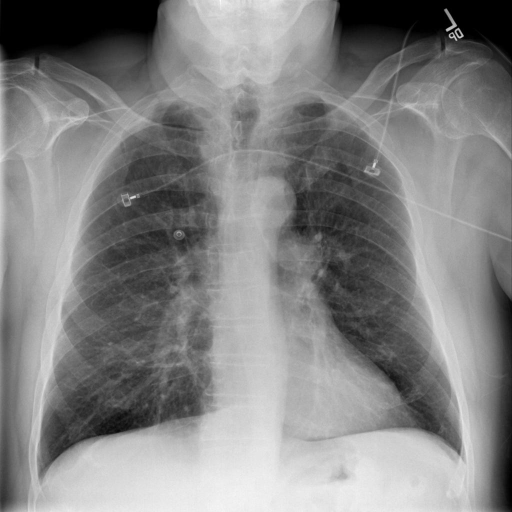

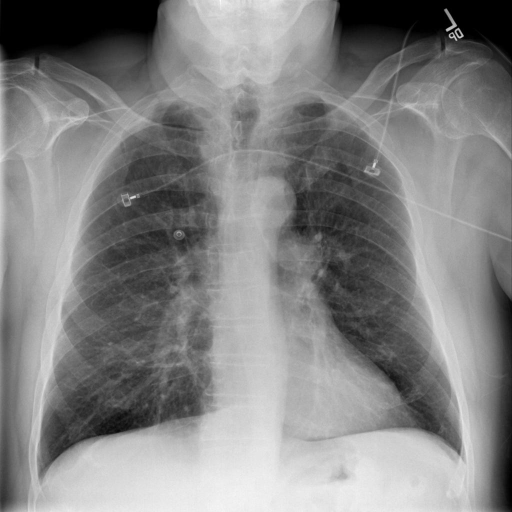

In [41]:
num = 16 #random test sample
im_o = np.vstack(X_test[:,4][num]).astype(float)
tex_o = X_test[:,6][num]

print("Original Sentence is : " , tex_o)
print("Predicted Sentence is : ",beam(im_o))
img = cv2.imread(X_test[:,1][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)
img = cv2.imread(X_test[:,2][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

Original Sentence is :  <start> heart size and mediastinal contour within normal limits. no focal airspace consolidation, pneumothora, or large pleural effusion. no acute osseous abnormality.
Predicted Sentence is :  <start> the heart is normal in size. the mediastinum is unremarkable. the lungs are clear. there is no pleural effusion or pneumothora. there is no focal air space opacity to suggest a pneumonia. there is no pleural effusion or pneumothora. <end>
The X-Rays are : 


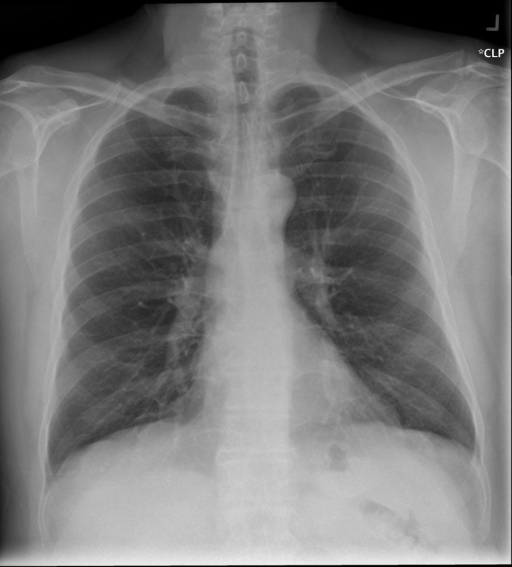

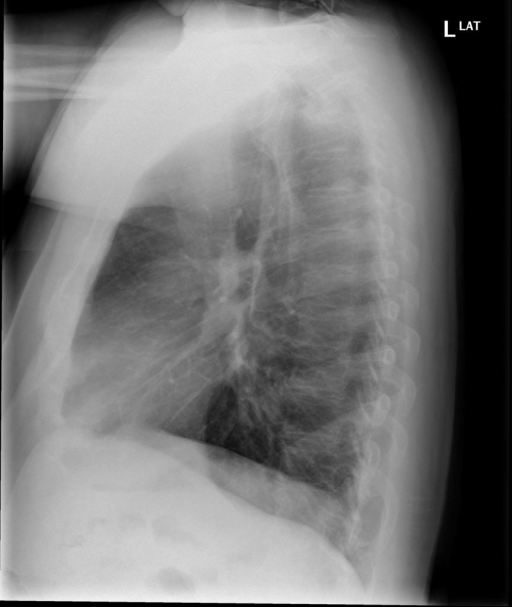

In [46]:
num =63 #random test sample
im_o = np.vstack(X_test[:,4][num]).astype(float)
tex_o = X_test[:,6][num]

print("Original Sentence is : " , tex_o)
print("Predicted Sentence is : ",beam(im_o))
print("The X-Rays are : ")
img = cv2.imread(X_test[:,1][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)
img = cv2.imread(X_test[:,2][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

Original Sentence is :  <start> lungs are clear. no pleural effusions or pneumothoraces. heart and mediastinum of normal size and contour. scoliosis.
Predicted Sentence is :  <start> the heart is normal in size and contour. the lungs are clear and epanded. heart and mediastinum and pulmonary vascularity are within normal limits. there is no pleural effusion or pneumothora is seen. there is no pleural effusion or pneumothora. there is no acute bony abnormality is identified. <end>
The X-Rays are : 


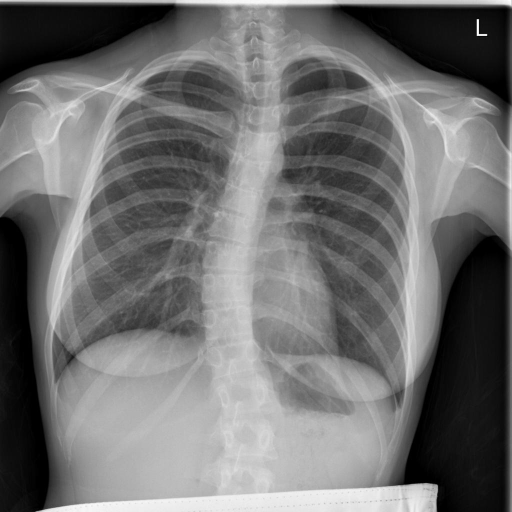

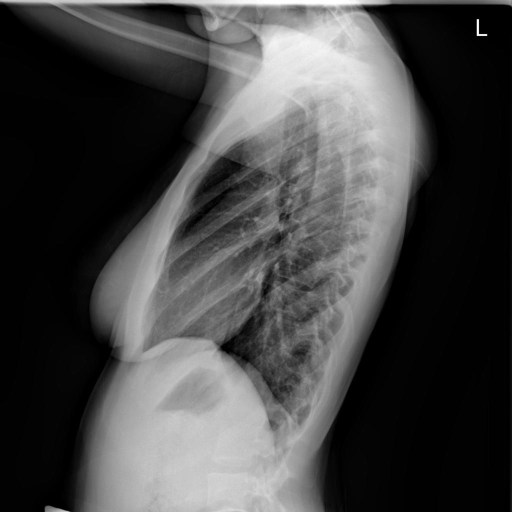

In [67]:
num = 118 #random test sample
im_o = np.vstack(X_test[:,4][num]).astype(float)
tex_o = X_test[:,6][num]

print("Original Sentence is : " , tex_o)
print("Predicted Sentence is : ",beam(im_o))
print("The X-Rays are : ")
img = cv2.imread(X_test[:,1][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)
img = cv2.imread(X_test[:,2][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

Original Sentence is :  <start> stable flattening of the posterior diaphragm and scattered chronic appearing irregular interstitial markings with no focal alveolar consolidation. stable cardiomediastinal silhouette with normal heart size and aortic ectasia/tortuosity, stable mediastinal contours. no definite pleural effusion seen, no typical findings of pulmonary edema. following spine ossifications and marginal osteophytes again noted.
Predicted Sentence is :  <start> the heart size is normal. the mediastinal contour is within normal limits. the lungs are free of any focal infiltrates. there are no nodules or masses. no visible pneumothora. <end>
The X-Rays are : 


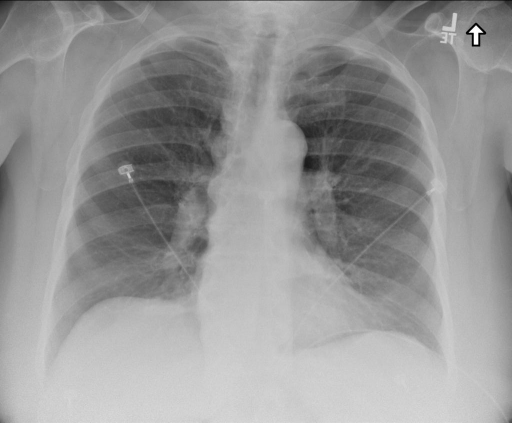

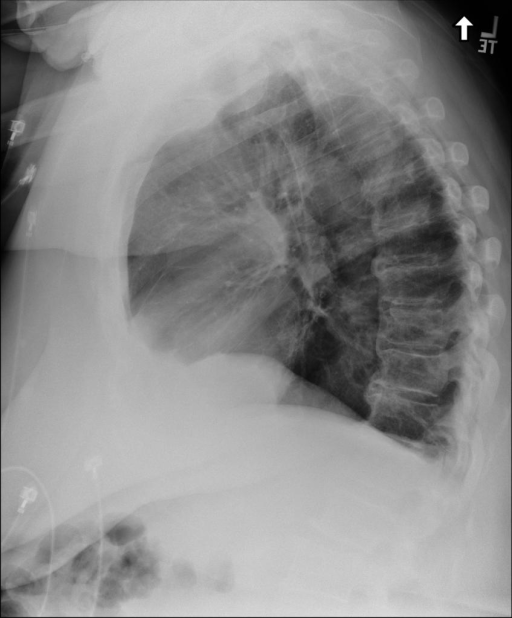

In [68]:
num = 166 #random test sample
im_o = np.vstack(X_test[:,4][num]).astype(float)
tex_o = X_test[:,6][num]

print("Original Sentence is : " , tex_o)
print("Predicted Sentence is : ",beam(im_o))
print("The X-Rays are : ")
img = cv2.imread(X_test[:,1][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)
img = cv2.imread(X_test[:,2][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

Original Sentence is :  <start> heart size near top normal, bilateral hilar fullness nonspecific in appearance, mild aortic ectasia/tortuosity. diaphragm flattening and relative apical lucencies suggestive of emphysema, and irregular interstitial markings, right greater than left. prominent left epicardial fat , no focal alveolar consolidation, no definite pleural effusion seen. atrial septal occluder artifact. mild spine curvature.
Predicted Sentence is :  <start> the heart size and pulmonary vascularity appear within normal limits. the lungs are free of focal airspace disease. no pleural effusion or pneumothora is seen. <end>
The X-Rays are : 


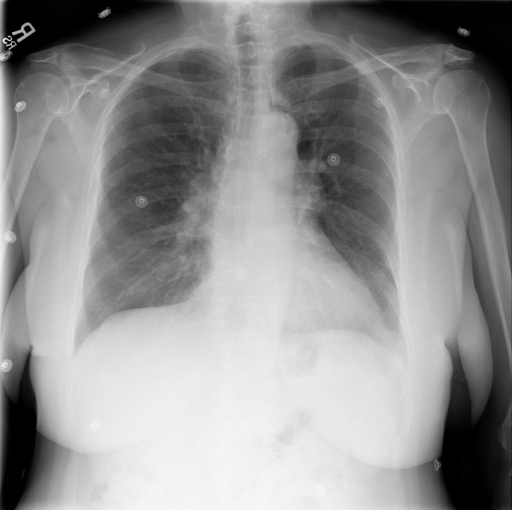

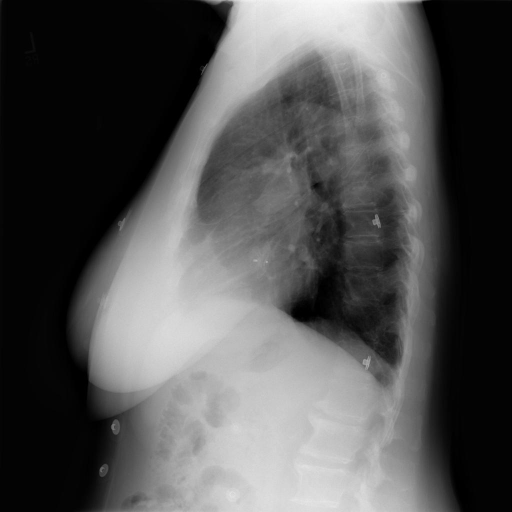

In [45]:
num = 155 #random test sample
im_o = np.vstack(X_test[:,4][num]).astype(float)
tex_o = X_test[:,6][num]

print("Original Sentence is : " , tex_o)
print("Predicted Sentence is : ",beam(im_o))
print("The X-Rays are : ")
img = cv2.imread(X_test[:,1][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)
img = cv2.imread(X_test[:,2][num], cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

In [42]:
count = set()
for num in range(650):
    im_o = np.vstack(X_test[:, 4][num]).astype(float)
    tex_o = X_test[:, 6][num]

    print("Sample Number:", num)
    print("Original Sentence is:", tex_o)
    print("Predicted Sentence is:", beam(im_o))
    print("The X-Rays are:")

    img1 = cv2.imread(X_test[:, 1][num], cv2.IMREAD_UNCHANGED)
    img2 = cv2.imread(X_test[:, 2][num], cv2.IMREAD_UNCHANGED)

    count.add(beam(im_o))
    print(count)
    # cv2_imshow(img1)
    # cv2_imshow(img2)
    print("\n" + "-"*50 + "\n")

Streaming output truncated to the last 5000 lines.
Sample Number: 25
Original Sentence is: <start> heart size normal. no pneumothora, pleural effusion, or focal airspace disease. bony structures appear intact. the trachea and pulmonary bronchi are unremarkable.
Predicted Sentence is: <start> the heart and pulmonary vasculature are within the lungs are clear and there are no pleural effusion or pleural effusion. there is no pleural effusion. there is no pleural effusion or pleural effusion. there is no pleural effusion. there is no pleural effusion. there is no pleural effusion. there is no pleural effusion. there is no pleural effusion. there is no pleural effusion. there is no pleural effusion or pleural effusion. there is no pleural effusion
The X-Rays are:
{'<start> the heart is normal in size. the mediastinum is unremarkable. the lungs are clear. there is no pleural effusion or pneumothora. there is no pleural effusion or pneumothora. there is no focal air space opacity to suggest 

In [43]:
len(count)

115

In [48]:
len(X_train)

2650

In [51]:
c = set()
for num in range(2650):
    im_o = np.vstack(X_train[:, 4][num]).astype(float)
    tex_o = X_train[:, 6][num]
    if(num%100 == 0):
      print("Sample Number:", num)
    # print("Sample Number:", num)
    # print("Original Sentence is:", tex_o)
    # print("Predicted Sentence is:", beam(im_o))
    # print("The X-Rays are:")

    # img1 = cv2.imread(X_test[:, 1][num], cv2.IMREAD_UNCHANGED)
    # img2 = cv2.imread(X_test[:, 2][num], cv2.IMREAD_UNCHANGED)

    c.add(beam(im_o))
    # print(count)
    # cv2_imshow(img1)
    # cv2_imshow(img2)
    # print("\n" + "-"*50 + "\n")

Sample Number: 0
Sample Number: 100
Sample Number: 200
Sample Number: 300
Sample Number: 400
Sample Number: 500
Sample Number: 600
Sample Number: 700
Sample Number: 800
Sample Number: 900
Sample Number: 1000
Sample Number: 1100
Sample Number: 1200
Sample Number: 1300
Sample Number: 1400
Sample Number: 1500
Sample Number: 1600
Sample Number: 1700
Sample Number: 1800
Sample Number: 1900
Sample Number: 2000
Sample Number: 2100
Sample Number: 2200
Sample Number: 2300
Sample Number: 2400
Sample Number: 2500
Sample Number: 2600


In [52]:
len(c)

235

In [44]:
#https://machinelearningmastery.com/calculate-bleu-score-for-text-python/
b1 = 0
b2 = 0
b3 = 0
b4 = 0


for i in range(X_test.shape[0]):
  im_o = np.vstack(X_test[:,4][i]).astype(float)
  pred = beam(im_o)
  org= X_test[:,5][i]




  b1 =  b1 + bleu.sentence_bleu([org.split()], pred.split() ,weights=(1, 0, 0, 0))
  b2 =  b2 + bleu.sentence_bleu([org.split()], pred.split(),weights=(0.5, 0.5, 0, 0))
  b3 =  b3 + bleu.sentence_bleu([org.split()], pred.split() ,weights=(0.33, 0.33, 0.33, 0))
  b4 =  b4 + bleu.sentence_bleu([org.split()], pred.split() ,weights=(0.25, 0.25, 0.25, 0.25))



print("Bleu1 score is : ",b1/X_test.shape[0])
print("Bleu2 score is : ",b2/X_test.shape[0])
print("Bleu3 score is : ",b3/X_test.shape[0])
print("Bleu4 score is : ",b4/X_test.shape[0])


Bleu1 score is :  0.28967782254346075
Bleu2 score is :  0.16346949890271206
Bleu3 score is :  0.09800016287606376
Bleu4 score is :  0.05079272629358272


In [ ]:
model_1.save_weights("attention_modelv8.h5")

In [ ]:
!cp -r /content/attention_modelv8.h5 /content/drive/MyDrive

<h2> Model Comparision <h2>


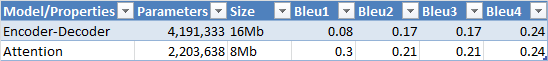